# A Deep Learning Approach to Safeguard Coral Reefs: Detecting Crown-of-Thorn Starfish in Underwater Footage
## Part 1/2: EDA & Data Augmentation

<h1><center>By: Ken K. Hong, Oanh Doan</center></h1>



# Abstract:

The Great Barrier Reef, a UNESCO World Heritage site, faces severe threats from climate change, environmental pollution, and the overpopulation of coral-eating starfish (COTS).

This project focuses on enhancing real-time COTS detection in underwater footage using a deep learning-based object detection model, **YOLOv11**. The model was trained on a dataset of 23,501 underwater images with bounding box annotations. It achieved:

- **mAP50:** 0.729  
- **mAP50-95:** 0.331  

With an inference speed of **7.0 ms per image** (143 frames per second), the model shows satisfactory performance for real-time COTS detection, contributing to coral reef protection efforts.


# Introduction/Background/Motivation


The Great Barrier Reef is the world’s largest coral reef ecosystem and a UNESCO World Heritage site, hosting over 400 coral species. It is one of Earth’s richest and most complex ecosystems. However, due to various factors—such as climate change, environmental pollution, seawater warming, and attacks by coral-eating starfish (COTS)—this coral reef ecosystem faces severe threats [5].

In particular, the overpopulation of COTS in Australia’s Great Barrier Reef has caused significant damage to the coral and poses a serious threat to its delicate ecosystem.

## Objective

Our primary goal is to develop an object detection model using deep learning to assist in the real-time detection of COTS from underwater footage. Key steps in the project include:
- **Baseline Model:** Implementing YOLOv11 by Ultralytics [4].  
- **Optimization:** Conducting hyper-parameter tuning to enhance model performance.  
- **Feature Enhancement:** Integrating the Convolutional Block Attention Model (CBAM) [6] to improve feature extraction by focusing on important image regions.  

A successful implementation of this model would contribute to the efforts to detect and control COTS outbreaks, protecting Australia’s marine life.

## Previous Methods

Before deep learning-based models, techniques like the ‘Manta Tow’ [1] were used to detect and remove COTS. Developed in the 1960s, the Manta Tow method relies on:
- A trained snorkeler being towed by a boat on the water's surface.
- Visual observation and subjective estimation to record the presence and abundance of COTS along with other reef metrics.  

While effective, these methods face several limitations:
- Lack of scalability.
- Poor image resolution.
- Reliability and traceability issues.

## Dataset Description

Our project uses the Crown-of-Thorns Starfish (COTS) dataset, compiled through a collaboration between CSIRO’s Data61, CSIRO Oceans & Atmosphere, Queensland University of Technology, and Google [2]. Key features of the dataset include:
- **Content:** Great Barrier Reef underwater footage with bounding box annotations for COTS.
- **Size:** 23,501 RGB images at a resolution of 1280 × 720 pixels.
- **Structure:** Images obtained from three distinct video IDs, each recorded in different underwater environments.  
  - Some images contain no bounding box annotations as they lack COTS.  
  - Images are identified by a unique combination of video ID and frame number.

### Unique Characteristics of the Dataset
1. **Single Class:** Focuses solely on detecting the COTS class.  
2. **Sequential Annotations:** Multiple images capture the same COTS from slightly different angles or positions.  
3. **Cryptic Behavior:** Includes overlapping COTS and partial visibility, as parts of the animal may be hidden.  



# Data Preprocessing and Transformation
In this section, we perform data preprocessing on the Great Barrier Reef dataset. This includes loading the training data, transforming and extracting relevant features such as image identifiers, annotations, and generating file paths. The transformations also involve counting annotations and preparing the dataset for further analysis and model training.

In [1]:
# Import Kaggle Data Sources
import kagglehub

# Login to Kaggle
kagglehub.login()

# Note:
# To use Kaggle's API, ensure you have your Kaggle credentials.
# Visit your Kaggle account page, navigate to the API section, and generate a new API token if needed.


Kaggle credentials set.
Kaggle credentials successfully validated.


In [2]:
import shutil
import os

# Import and Setup Kaggle Data Sources
# NOTE: This notebook environment differs from Kaggle's Python environment,
# so some libraries used in Kaggle may not be pre-installed here.

# Download the TensorFlow Great Barrier Reef dataset
tensorflow_great_barrier_reef_path = kagglehub.competition_download(
    'tensorflow-great-barrier-reef'
)

# Define source and target paths
source_path = "/root/.cache/kagglehub/competitions/tensorflow-great-barrier-reef"
destination_path = "/content/tensorflow-great-barrier-reef"

# Check if the source path exists
if os.path.exists(source_path):
    # Move the dataset to the target location
    shutil.move(source_path, destination_path)
    print(f"Dataset moved to: {destination_path}")
else:
    print(f"Source directory does not exist: {source_path}")

print("Data source import complete.")

# Estimated times:
# - Download: ~2 mins (14.2 GB at 100 MB/s)
# - Extraction: ~3 mins


100%|██████████| 14.2G/14.2G [02:37<00:00, 96.6MB/s]


Extracting files...
Dataset moved to: /content/tensorflow-great-barrier-reef
Data source import complete.


In [3]:
# Import necessary libraries for data processing and visualization

# import gc  # Garbage collection to manage memory
import numpy as np  # For numerical computations
import pandas as pd  # For data manipulation and analysis
import random  # For random number generation

# Importing libraries for image processing and display
from IPython.display import display  # For displaying images and outputs
from PIL import Image  # For working with images
import cv2  # OpenCV library for image processing
import matplotlib.pyplot as plt  # For plotting and visualization


In [4]:
# Load training and test datasets into pandas DataFrames
df_train = pd.read_csv('../content/tensorflow-great-barrier-reef/train.csv')
df_test = pd.read_csv('../content/tensorflow-great-barrier-reef/test.csv')

# Display the first few rows of the training dataset
df_train.head()


,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,0,40258,0,0,0-0,[]
1,0,40258,1,1,0-1,[]
2,0,40258,2,2,0-2,[]
3,0,40258,3,3,0-3,[]
4,0,40258,4,4,0-4,[]


In [5]:
# Create a copy of the original dataframe for transformation
df_transform = df_train.copy(deep=True)

# Extract image number from 'image_id' and convert to numeric
df_transform['image_id_num'] = df_transform['image_id'].str.split('-').str[1]
df_transform['image_id_num'] = pd.to_numeric(df_transform['image_id_num'])

# Convert annotations from string to list
df_transform['annotations_lst'] = df_transform['annotations'].apply(eval)

# Count the number of annotations for each image
df_transform['annotations_count'] = df_transform['annotations_lst'].apply(len)

# Generate the full file path for each image
df_transform['image_id_loc'] = (
    '../content/tensorflow-great-barrier-reef/train_images/video_'
    + df_transform['video_id'].astype(str) + '/'
    + df_transform['image_id_num'].astype(str) + '.jpg'
)

# Display the first few rows of the transformed dataframe
df_transform.head()


,video_id,sequence,video_frame,sequence_frame,image_id,annotations,image_id_num,annotations_lst,annotations_count,image_id_loc
0,0,40258,0,0,0-0,[],0,[],0,../content/tensorflow-great-barrier-reef/train...
1,0,40258,1,1,0-1,[],1,[],0,../content/tensorflow-great-barrier-reef/train...
2,0,40258,2,2,0-2,[],2,[],0,../content/tensorflow-great-barrier-reef/train...
3,0,40258,3,3,0-3,[],3,[],0,../content/tensorflow-great-barrier-reef/train...
4,0,40258,4,4,0-4,[],4,[],0,../content/tensorflow-great-barrier-reef/train...


In [6]:
# Display the full content of columns (no truncation) using pd.option_context
with pd.option_context('display.max_colwidth', None):
    # Print the 'image_id_loc' at index 13000
    print(df_transform['image_id_loc'].iloc[13000])

    # Print a separator for better readability
    print("-" * 100)

    # Print a row where 'annotations_count' equals 8 and display specified columns
    print(df_transform[df_transform['annotations_count'] == 8][[
        'video_id',
        'sequence',
        'video_frame',
        'annotations_lst',
        'annotations_count',
        'image_id_loc'
    ]].iloc[5])  # Display the row with index 5 from the filtered dataset


../content/tensorflow-great-barrier-reef/train_images/video_1/9435.jpg
----------------------------------------------------------------------------------------------------
video_id                                                                                                                                                                                                                                                                                                                                                                                                                   1
sequence                                                                                                                                                                                                                                                                                                                                                                                                                8503
vi

# Exploratory Data Analysis (EDA) and Image Augmentation Visualization
In this section, we conduct an exploratory data analysis (EDA) to better understand the characteristics of the dataset, focusing on the impact of image augmentation techniques. By applying various image transformations, we visualize how these augmentations enhance the diversity and quality of training data, helping to improve model robustness and performance. This process aids in understanding the effects of data augmentation on model generalization, especially in the context of underwater imagery in the Great Barrier Reef dataset.

## EDA

In [7]:
def review_dataframe(video_id):
    """
    Provides a detailed review of the DataFrame for a specific video ID.

    Args:
        video_id (int): The video ID to analyze.
    """
    print(f"Review for Video ID: {video_id}")
    print("-" * 60)

    # Filter the dataframe for the specified video_id
    filtered_df = df_transform[df_transform['video_id'] == video_id]

    # Get the maximum and minimum video frame
    max_video_frame = filtered_df['video_frame'].max()
    min_video_frame = filtered_df['video_frame'].min()

    # Print general information about the video
    print(f"Count for Video ID: {filtered_df.shape[0]}")
    print("-" * 60)
    print(f"Maximum Video Frame: {max_video_frame}")
    print(f"Minimum Video Frame: {min_video_frame}")
    print("-" * 60)

    # Calculate the annotated and non-annotated frames
    annotated_count = np.sum(filtered_df['annotations'] != '[]')
    non_annotated_count = np.sum(filtered_df['annotations'] == '[]')

    # Calculate the percentage of annotated frames
    annotated_percentage = (
        annotated_count / (annotated_count + non_annotated_count)) * 100

    # Print the count and percentage of annotated frames
    print(f"Number of Annotated Frames: {annotated_count}")
    print(f"Number of Non-Annotated Frames: {non_annotated_count}")
    print(f"Percentage of Annotated Frames: {annotated_percentage:.2f}%")
    print("-" * 60)

    # Display summary statistics for the filtered dataframe
    print(filtered_df.describe().loc[['count', 'min', 'max']].T)


df_transform.describe().loc[['count', 'min', 'max']].T


,count,min,max
video_id,23501.0,0.0,2.0
sequence,23501.0,996.0,60754.0
video_frame,23501.0,0.0,12347.0
sequence_frame,23501.0,0.0,2987.0
image_id_num,23501.0,0.0,12347.0
annotations_count,23501.0,0.0,18.0


In [8]:
# Review the DataFrame for Video ID 0
review_dataframe(0)
print("\n" * 2)  # Add spacing for readability

# Review the DataFrame for Video ID 1
review_dataframe(1)
print("\n" * 2)  # Add spacing for readability

# Review the DataFrame for Video ID 2
review_dataframe(2)


Review for Video ID: 0
------------------------------------------------------------
Count for Video ID: 6708
------------------------------------------------------------
Maximum Video Frame: 12347
Minimum Video Frame: 0
------------------------------------------------------------
Number of Annotated Frames: 2143
Number of Non-Annotated Frames: 4565
Percentage of Annotated Frames: 31.95%
------------------------------------------------------------
                    count    min      max
video_id           6708.0    0.0      0.0
sequence           6708.0  996.0  59337.0
video_frame        6708.0    0.0  12347.0
sequence_frame     6708.0    0.0   1422.0
image_id_num       6708.0    0.0  12347.0
annotations_count  6708.0    0.0      5.0



Review for Video ID: 1
------------------------------------------------------------
Count for Video ID: 8232
------------------------------------------------------------
Maximum Video Frame: 11374
Minimum Video Frame: 0
--------------------------------

In [9]:
def get_image(video_id, video_frame):
    """Helper function to retrieve image from the DataFrame based on video_id and video_frame."""
    try:
        image_path = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['image_id_loc'].iloc[0]
        return Image.open(image_path)
    except IndexError:
        raise ValueError(
            f"Image not found for video_id {video_id} and video_frame {video_frame}")


def draw_bounding_boxes(image, bounding_boxes):
    """Draw bounding boxes on the image."""
    # Convert PIL image to OpenCV format (NumPy array)
    img_cv = np.array(image)
    img_cv = cv2.cvtColor(img_cv, cv2.COLOR_RGB2BGR)

    for bb in bounding_boxes:
        x = int(bb['x'])
        y = int(bb['y'])
        width = int(bb['width'])
        height = int(bb['height'])
        x1 = x + width
        y1 = y + height

        # Draw the rectangle on the image
        cv2.rectangle(img_cv, (x, y), (x1, y1), (134, 0, 255), 2)

    # Convert the image back to PIL format
    img_pil = Image.fromarray(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
    return img_pil


def show_COT_img(video_id, video_frame):
    """
    Retrieve the image based on video_id and video_frame without resizing.

    Args:
    video_id (str): The ID of the video.
    video_frame (int): The frame number in the video.

    Returns:
    PIL.Image: The original image.
    """
    img = get_image(video_id, video_frame)
    return img


def show_COT_img_BB(video_id, video_frame):
    """
    Retrieve an image and overlay bounding boxes on it without resizing.

    Args:
    video_id (str): The ID of the video.
    video_frame (int): The frame number in the video.

    Returns:
    PIL.Image: The image with bounding boxes drawn on it.
    """
    img = show_COT_img(
        video_id, video_frame)  # Get original image without resizing

    # Retrieve the bounding box annotations from the DataFrame
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    if bounding_boxes:
        img = draw_bounding_boxes(img, bounding_boxes)

    return img


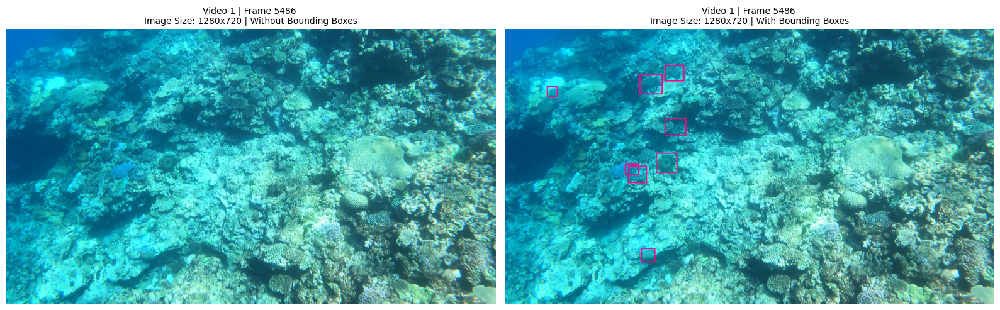

In [10]:
# Set the video_id and frame_id for visualization
video_id = 1
frame_id = 5486

# Optionally, you can change the video_id and frame_id to test other frames
# video_id = 2
# frame_id = 5900

# Retrieve the images (one with and one without bounding boxes)
img = show_COT_img(video_id, frame_id)
img_with_bb = show_COT_img_BB(video_id, frame_id)

# Get the image dimensions (width, height)
img_width, img_height = img.size
img_with_bb_width, img_with_bb_height = img_with_bb.size

# Create a subplot to display both images side by side
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# Display the original image (without bounding boxes)
axs[0].imshow(img)
axs[0].set_title(
    f"Video {video_id} | Frame {frame_id} \nImage Size: {img_width}x{img_height} | Without Bounding Boxes", fontsize=10)
axs[0].axis('off')  # Hide axis for better visualization

# Display the image with bounding boxes
axs[1].imshow(img_with_bb)
axs[1].set_title(
    f"Video {video_id} | Frame {frame_id} \nImage Size: {img_with_bb_width}x{img_with_bb_height} | With Bounding Boxes", fontsize=10)
axs[1].axis('off')  # Hide axis for better visualization

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the images
plt.show()


In [11]:
def random_img_withAnnotation(video_id, annotations_count, n=4, random_state=42):
    # Filter the DataFrame based on video_id and annotations_count
    filtered_df = df_transform[(df_transform['video_id'] == video_id) & (
        df_transform['annotations_count'] >= annotations_count)]

    # Randomly select 'n' samples from the filtered DataFrame
    random_selection = filtered_df.sample(
        n=n, random_state=random_state).video_frame.tolist()

    return sorted(random_selection)


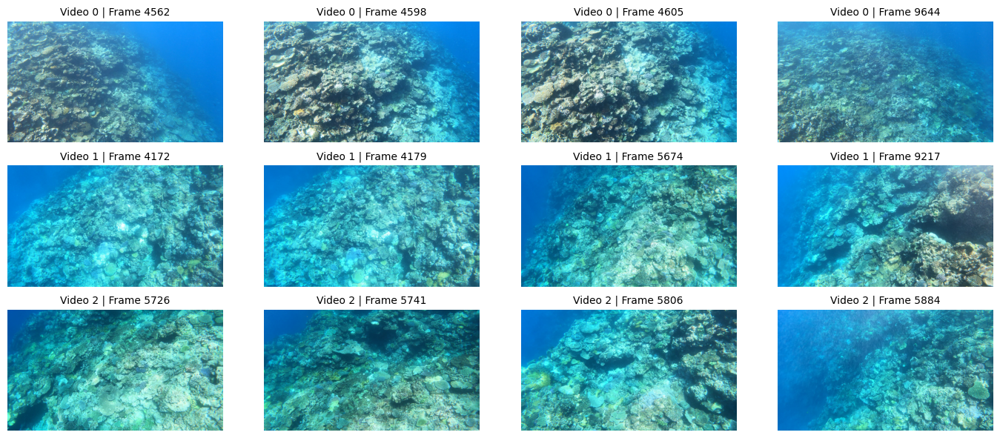

In [12]:
# Generate the list of video IDs and corresponding frame IDs
video_id_lst = [i for i in range(0, 3) for _ in range(4)]
frame_lst = [random_img_withAnnotation(i, 4) for i in range(0, 3)]

# Flatten the list of frame IDs
frame_lst = [item for sublist in frame_lst for item in sublist]

# Pair video IDs with frame IDs
video_img_pairs = zip(video_id_lst, frame_lst)

# Set up the figure for displaying images
plt.figure(figsize=(14, 6))

# Loop through each pair (video_id, frame_id) and display the corresponding image
for idx, (video_id, frame_id) in enumerate(video_img_pairs):
    plt.subplot(3, 4, idx + 1)  # Create a 3x4 grid of subplots

    # Retrieve the image for the current video and frame
    img_resized = show_COT_img(video_id, frame_id)

    # Display the image
    plt.imshow(img_resized)

    # Set the title for the subplot
    plt.title(f"Video {video_id} | Frame {frame_id}", fontsize=10)

    # Remove the axis for a cleaner visualization
    plt.axis('off')

# Adjust layout to ensure proper spacing between subplots
plt.tight_layout()

# Show the plot with the images
plt.show()


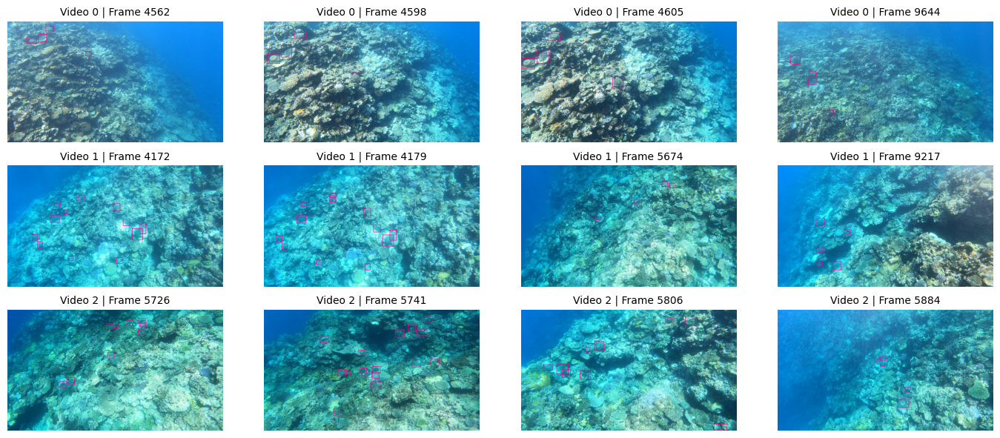

In [13]:
# Generate the list of video IDs and corresponding frame IDs
video_id_lst = [i for i in range(0, 3) for _ in range(4)]
frame_lst = [random_img_withAnnotation(i, 4) for i in range(0, 3)]

# Flatten the list of frame IDs
frame_lst = [item for sublist in frame_lst for item in sublist]

# Pair video IDs with frame IDs
video_img_pairs = zip(video_id_lst, frame_lst)

# Set up the figure for displaying images (14x6 inches)
plt.figure(figsize=(14, 6))

# Loop through each pair (video_id, frame_id) and display the corresponding image
for idx, (video_id, frame_id) in enumerate(video_img_pairs):
    # Create a subplot for each image in a 3x4 grid
    plt.subplot(3, 4, idx + 1)

    # Retrieve the image with bounding boxes for the current video and frame
    img_resized = show_COT_img_BB(video_id, frame_id)

    # Display the image
    plt.imshow(img_resized)

    # Set the title for the subplot
    plt.title(f"Video {video_id} | Frame {frame_id}", fontsize=10)

    # Remove the axis for a cleaner visualization
    plt.axis('off')

# Adjust layout to ensure proper spacing between subplots
plt.tight_layout()

# Show the plot with the images
plt.show()


## DATA AUGMENTATION

### Import Modules

In [14]:
!pip install - U albumentations ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.1/258.1 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 19.9 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20


In [15]:
!pip install - U albumentations


In [16]:
# https://docs.ultralytics.com/integrations/albumentations/
# Enhance Your Dataset to Train YOLO11 Using Albumentations  based on https://explore.albumentations.ai/
import albumentations as A


In [17]:
def convert_bboxes_to_pascal_voc_format(bboxes):
    """
    Convert bounding boxes from {'x': x, 'y': y, 'width': w, 'height': h}
    to Pascal VOC format [xmin, ymin, xmax, ymax].
    """
    return [[box['x'], box['y'], box['x'] + box['width'], box['y'] + box['height']] for box in bboxes]


def convert_bboxes_to_yolo(bboxes):
    """
    Convert bounding boxes from {'x': x, 'y': y, 'width': w, 'height': h}
    to Pascal VOC format [xmin, ymin, xmax, ymax].
    """
    return [[box['x'], box['y'], box['width'], box['height']] for box in bboxes]


def convert_bboxes_to_original_format(bboxes):
    """
    Convert bounding boxes from Pascal VOC format [xmin, ymin, xmax, ymax]
    to {'x': xmin, 'y': ymin, 'width': xmax - xmin, 'height': ymax - ymin}.
    """
    return [{'x': box[0], 'y': box[1], 'width': box[2] - box[0], 'height': box[3] - box[1]} for box in bboxes]


def apply_transformation_and_draw_bboxes(img, pascal_bboxes, transform, convert_bboxes_to_original_format, draw_bounding_boxes):
    """
    Applies a transformation to the input image and bounding boxes, then draws the bounding boxes on the transformed image.

    Parameters:
    - img: The input image in PIL format.
    - pascal_bboxes: The bounding boxes in PASCAL VOC format (list of [xmin, ymin, xmax, ymax]).
    - transform: The transformation function to apply (should accept 'image' and 'bboxes').
    - convert_bboxes_to_original_format: Function to convert transformed bounding boxes back to original format.
    - draw_bounding_boxes: Function to draw bounding boxes on the image.

    Returns:
    - result_img: The transformed image with bounding boxes drawn (if available).
    """

    # Apply the transformation to the image and bounding boxes
    transformed = transform(image=np.array(
        img), bboxes=pascal_bboxes)  # No labels needed

    # Get the transformed image and bounding boxes
    transformed_img = transformed['image']
    transformed_bboxes = transformed['bboxes']

    # Convert transformed bounding boxes back to the original format
    original_bboxes = convert_bboxes_to_original_format(transformed_bboxes)

    # Convert the transformed image back to PIL format
    result_img = Image.fromarray(transformed_img)

    # Draw bounding boxes on the transformed image (if available)
    if original_bboxes:
        result_img = draw_bounding_boxes(result_img, original_bboxes)

    return result_img


### apply_rotation_transform

In [18]:
def apply_rotation_transform(video_id, video_frame, limit=(-90, 90), interpolation=cv2.INTER_LINEAR,
                             border_mode=cv2.BORDER_REFLECT_101, value=0, mask_value=None,
                             rotate_method='largest_box', crop_border=False,
                             p=0.5):
    """
    Apply random rotation to an image and rotate bounding boxes based on specified parameters using Albumentations.

    Parameters:
        video_id (int): The ID of the video.
        video_frame (int): The frame number of the video.
        limit (float or tuple): Range from which a random angle is picked. Default is (-90, 90).
        interpolation (OpenCV flag): Interpolation algorithm. Default is cv2.INTER_LINEAR.
        border_mode (OpenCV flag): Extrapolation method. Default is cv2.BORDER_REFLECT_101.
        value (int, float, list): Padding value for constant border mode. Default is 0.
        mask_value (int, float, list, optional): Padding value for constant mask border mode. Default is None.
        rotate_method (str): Method to rotate bounding boxes. Default is 'largest_box'.
        crop_border (bool): Whether to crop the border after rotation. Default is False.
        p (float): Probability of applying the transformation. Default is 0.5.

    Returns:
        tuple:
            PIL.Image.Image: The transformed image with bounding boxes if available.
            str: Title summarizing the transformation parameters.
    """

    # Retrieve the image (Assume get_image is a function that fetches the frame)
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Retrieve bounding boxes and convert them to Pascal VOC format
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    # Convert bounding boxes to Pascal VOC format: [xmin, ymin, xmax, ymax]
    pascal_bboxes = convert_bboxes_to_pascal_voc_format(bounding_boxes)

    # Define the rotation transformation with bbox_params
    transform = A.Compose([
        A.Rotate(
            limit=limit,
            interpolation=interpolation,
            border_mode=border_mode,
            value=value,
            mask_value=mask_value,
            rotate_method=rotate_method,
            crop_border=crop_border,
            p=p
        )
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=[]))  # Define label_fields as an empty list

    # Add a title summarizing the transformation parameters
    # title = f"Rotation transformation | Limit: {limit}, Interpolation: {interpolation}, Border Mode: {border_mode}, p: {p}"
    title = f"Rotation Transformation"

    result_img = apply_transformation_and_draw_bboxes(
        img, pascal_bboxes, transform, convert_bboxes_to_original_format, draw_bounding_boxes)

    return result_img, title

# transformed_img, transformation_title = apply_rotation_transform(
#     video_id,
#     frame_id,
#     value = 19,
#     df_transform=df_transform,
#     limit=(-50, -30),
#     interpolation=cv2.INTER_LINEAR,
#     border_mode=cv2.BORDER_REFLECT_101,
#     p=1
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_random_affine_transform

In [19]:
def apply_random_affine_transform(video_id, video_frame, shift_limit=(-0.0625, 0.0625),
                                  scale_limit=(-0.1, 0.1), rotate_limit=(-45, 45), interpolation=cv2.INTER_LINEAR,
                                  p=0.5):
    """
    Apply random affine transformations to an image including translation, scaling, and rotation.

    Parameters:
        shift_limit ((float, float) or float): Shift factor range for both height and width.
        scale_limit ((float, float) or float): Scaling factor range.
        rotate_limit ((int, int) or int): Rotation range in degrees.
        interpolation (OpenCV flag): Interpolation algorithm.
        p (float): Probability of applying the transform.

    Returns:
        tuple: Transformed image and title summarizing the transformation parameters.
    """

    # Retrieve the image (Assume get_image is a function that fetches the frame)
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Retrieve bounding boxes and convert them to Pascal VOC format
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    # Convert bounding boxes to Pascal VOC format: [xmin, ymin, xmax, ymax]
    pascal_bboxes = convert_bboxes_to_pascal_voc_format(bounding_boxes)

    # Define the affine transformation
    transform = A.Compose([
        A.Affine(
            translate_percent=shift_limit if isinstance(
                shift_limit, tuple) else (shift_limit, shift_limit),
            scale=scale_limit if isinstance(
                scale_limit, tuple) else (-scale_limit, scale_limit),
            # assumes the limit is a tuple or single int
            rotate=rotate_limit if isinstance(
                rotate_limit, int) else rotate_limit[0],
            interpolation=interpolation,
            p=p
        )
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=[]))  # Define label_fields as an empty list

    # Add a title summarizing the transformation parameters
    # title = (f"Affine transformation | Shift Limit: {shift_limit}, Scale Limit: {scale_limit}, "
    #          f"Rotate Limit: {rotate_limit}, Interpolation: {interpolation}, p: {p}")
    title = (f"Affine Transformation")
    result_img = apply_transformation_and_draw_bboxes(
        img, pascal_bboxes, transform, convert_bboxes_to_original_format, draw_bounding_boxes)

    return result_img, title

# transformed_img, transformation_title = apply_random_affine_transform(
#     video_id,
#     frame_id,
#     df_transform=df_transform,
#     shift_limit=(-0.2, 0.3),
#     scale_limit=(0.8, 0.9),
#     rotate_limit=(20, 45),
#     interpolation=cv2.INTER_LINEAR,
#     p=1
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_coarse_dropout

In [20]:
def apply_coarse_dropout(video_id, video_frame,
                         num_holes_range=(1, 1),
                         hole_height_range=(8, 8),
                         hole_width_range=(8, 8),
                         fill_value=0,
                         mask_fill_value=None,
                         p=0.5):
    """
    Apply CoarseDropout to simulate occlusion and varied object sizes in the input image and mask.

    Parameters:
        video_id (int): ID of the video containing the frame to be transformed.
        video_frame (int): Frame number to apply the transformation to.
        df_transform (pd.DataFrame): DataFrame containing annotations for bounding boxes and other metadata.
        num_holes_range (tuple[int, int]): Range for the number of rectangular dropout regions. Default: (1, 1).
        hole_height_range (tuple[ScalarType, ScalarType]): Range for the height of dropout regions. Default: (8, 8).
        hole_width_range (tuple[ScalarType, ScalarType]): Range for the width of dropout regions. Default: (8, 8).
        fill_value (int | float | str | tuple): Value for the dropped pixels. Default: 0.
        mask_fill_value (int | float | tuple | None): Fill value for dropout regions in the mask. Default: None.
        p (float): Probability of applying the transformation. Default: 0.5.

    Returns:
        tuple: Transformed image and title summarizing the transformation parameters.
    """

    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Retrieve bounding boxes and convert them to Pascal VOC format
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]
    pascal_bboxes = convert_bboxes_to_pascal_voc_format(bounding_boxes)

    # Define the CoarseDropout transformation
    transform = A.Compose([
        A.CoarseDropout(
            max_holes=num_holes_range[1],
            min_holes=num_holes_range[0],
            max_height=hole_height_range[1] if isinstance(
                hole_height_range[1], int) else int(hole_height_range[1] * img.size[1]),
            min_height=hole_height_range[0] if isinstance(
                hole_height_range[0], int) else int(hole_height_range[0] * img.size[1]),
            max_width=hole_width_range[1] if isinstance(
                hole_width_range[1], int) else int(hole_width_range[1] * img.size[0]),
            min_width=hole_width_range[0] if isinstance(
                hole_width_range[0], int) else int(hole_width_range[0] * img.size[0]),
            fill_value=fill_value,
            mask_fill_value=mask_fill_value,
            p=p
        )
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=[]))  # Define label_fields as an empty list

    # Add a title summarizing the transformation parameters
    # title = (f"CoarseDropout | Num Holes: {num_holes_range}, Hole Height: {hole_height_range}, "
    #          f"Hole Width: {hole_width_range}, Fill Value: {fill_value}, p: {p}")
    title = (f"Coarse Dropout")
    # Apply the transformation
    result_img = apply_transformation_and_draw_bboxes(img, pascal_bboxes, transform,
                                                      convert_bboxes_to_original_format, draw_bounding_boxes)

    return result_img, title

# transformed_img, transformation_title = apply_coarse_dropout(
#     video_id,
#     frame_id,
#     df_transform=df_transform,
#     num_holes_range=(8, 15),
#     hole_height_range=(0.02, 0.05),
#     hole_width_range=(0.02, 0.05),
#     fill_value="random",
#     p=1.0
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_grid_elastic_deformation

In [21]:
def apply_grid_elastic_deformation(video_id, video_frame,
                                   num_grid_xy=(4, 4), magnitude=10,
                                   interpolation=cv2.INTER_LINEAR,
                                   mask_interpolation=cv2.INTER_NEAREST, p=1.0):
    """
    Apply grid-based elastic deformations to images, masks, bounding boxes, and keypoints.

    Parameters:
        video_id (int): ID of the video containing the frame to be transformed.
        video_frame (int): Frame number to apply the transformation to.
        df_transform (pd.DataFrame): DataFrame containing annotations for bounding boxes and other metadata.
        num_grid_xy (tuple[int, int]): Number of grid cells along the width and height. Must be greater than (1, 1).
        magnitude (int): Maximum pixel-wise displacement for distortion. Must be greater than 0.
        interpolation (int): Interpolation method for the image. Default: cv2.INTER_LINEAR.
        mask_interpolation (int): Interpolation method for the mask. Default: cv2.INTER_NEAREST.
        p (float): Probability of applying the transformation. Default: 1.0.

    Returns:
        tuple: Transformed image and title summarizing the transformation parameters.
    """

    if num_grid_xy[0] <= 1 or num_grid_xy[1] <= 1:
        raise ValueError(
            "num_grid_xy must contain values greater than 1 for both dimensions.")
    if magnitude <= 0:
        raise ValueError("magnitude must be greater than 0.")

    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Retrieve bounding boxes and convert them to Pascal VOC format
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]
    pascal_bboxes = convert_bboxes_to_pascal_voc_format(bounding_boxes)

    # Define the grid-based elastic transformation
    transform = A.Compose([
        A.GridDistortion(
            # Albumentations uses `num_steps` to control grid granularity
            num_steps=max(num_grid_xy),
            # Normalized magnitude for distortions
            distort_limit=(0, magnitude / 100),
            interpolation=interpolation,
            border_mode=cv2.BORDER_REFLECT_101,
            p=p
        )
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=[]))  # Define label_fields as an empty list

    # Add a title summarizing the transformation parameters
    # title = (f"Grid Elastic Deformation | Grid: {num_grid_xy}, Magnitude: {magnitude}, "
    #          f"Interpolation: {interpolation}, p: {p}")
    title = (f"Grid Elastic Deformation")
    # Apply the transformation
    result_img = apply_transformation_and_draw_bboxes(img, pascal_bboxes, transform,
                                                      convert_bboxes_to_original_format, draw_bounding_boxes)

    return result_img, title

# transformed_img, transformation_title = apply_grid_elastic_deformation(
#     video_id,
#     frame_id,
#     df_transform=df_transform,
#     num_grid_xy=(10, 30),
#     magnitude=15,
#     interpolation=cv2.INTER_LINEAR,
#     p=1.0
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_pixel_dropout

In [22]:
def apply_pixel_dropout(video_id, video_frame,
                        dropout_prob=0.01,
                        per_channel=False,
                        drop_value=0,
                        mask_drop_value=None,
                        always_apply=False,
                        p=0.5):
    """
    Apply PixelDropout transformation to randomly drop pixels from the image and mask.

    Parameters:
        video_id (int): ID of the video containing the frame to be transformed.
        video_frame (int): Frame number to apply the transformation to.
        df_transform (pd.DataFrame): DataFrame containing annotations for bounding boxes and other metadata.
        dropout_prob (float): Probability of dropping each pixel. Default: 0.01.
        per_channel (bool): If True, generates dropout mask independently for each channel. Default: False.
        drop_value (float | Sequence[float] | None): Value to assign to dropped pixels. Default: 0.
        mask_drop_value (float | Sequence[float] | None): Value to assign to dropped pixels in the mask. Default: None.
        always_apply (bool): If True, transformation is always applied. Default: False.
        p (float): Probability of applying the transformation. Default: 0.5.

    Returns:
        tuple: Transformed image and title summarizing the transformation parameters.
    """
    if per_channel and mask_drop_value is not None:
        raise ValueError(
            "PixelDropout supports masks only with per_channel=False.")

    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Retrieve bounding boxes and convert them to Pascal VOC format
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]
    pascal_bboxes = convert_bboxes_to_pascal_voc_format(bounding_boxes)

    # Define the PixelDropout transformation
    transform = A.Compose([
        A.PixelDropout(
            dropout_prob=dropout_prob,
            per_channel=per_channel,
            drop_value=drop_value,
            mask_drop_value=mask_drop_value,
            always_apply=always_apply,
            p=p
        )
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=[]))  # Define label_fields as an empty list

    # Add a title summarizing the transformation parameters
    # title = (f"PixelDropout | Dropout Probability: {dropout_prob}, Per Channel: {per_channel}, "
    #          f"Drop Value: {drop_value}, Mask Drop Value: {mask_drop_value}, p: {p}")
    title = (f"Pixel Dropout")

    # Apply the transformation
    result_img = apply_transformation_and_draw_bboxes(img, pascal_bboxes, transform,
                                                      convert_bboxes_to_original_format, draw_bounding_boxes)

    return result_img, title


# transformed_img, transformation_title = apply_pixel_dropout(
#     video_id,
#     frame_id,
#     df_transform=df_transform,
#     dropout_prob=0.05,
#     per_channel=False,
#     drop_value=0,
#     mask_drop_value=3,
#     p=1.0
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_vertical_flip

In [23]:
def apply_vertical_flip(video_id, video_frame, p=0.5):
    """
    Flip the input image vertically around the x-axis.

    Parameters:
        video_id (int): ID of the video containing the frame to be transformed.
        video_frame (int): Frame number to apply the transformation to.
        df_transform (pd.DataFrame): DataFrame containing annotations for bounding boxes and other metadata.
        p (float): Probability of applying the transform. Default: 0.5.

    Returns:
        tuple: Transformed image and title summarizing the transformation parameters.
    """
    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Retrieve bounding boxes and convert them to Pascal VOC format
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]
    pascal_bboxes = convert_bboxes_to_pascal_voc_format(bounding_boxes)

    # Define the VerticalFlip transformation
    transform = A.Compose([
        A.VerticalFlip(p=p)
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=[]))  # Define label_fields as an empty list

    # Add a title summarizing the transformation parameters
    # title = f"VerticalFlip | p: {p}"
    title = f"Vertical Flip"

    # Apply the transformation
    result_img = apply_transformation_and_draw_bboxes(img, pascal_bboxes, transform,
                                                      convert_bboxes_to_original_format, draw_bounding_boxes)

    return result_img, title


# # Example usage
# transformed_img, transformation_title = apply_vertical_flip(
#     video_id,
#     frame_id,
#     df_transform=df_transform,
#     p=1.0
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_horizontal_flip

In [24]:
def apply_horizontal_flip(video_id, video_frame, p=0.5):
    """
    Flip the input image horizontally around the y-axis.

    Parameters:
        video_id (int): ID of the video containing the frame to be transformed.
        video_frame (int): Frame number to apply the transformation to.
        df_transform (pd.DataFrame): DataFrame containing annotations for bounding boxes and other metadata.
        p (float): Probability of applying the transform. Default: 0.5.

    Returns:
        tuple: Transformed image and title summarizing the transformation parameters.
    """
    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Retrieve bounding boxes and convert them to Pascal VOC format
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]
    pascal_bboxes = convert_bboxes_to_pascal_voc_format(bounding_boxes)

    # Define the HorizontalFlip transformation
    transform = A.Compose([
        A.HorizontalFlip(p=p)
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=[]))  # Define label_fields as an empty list

    # Add a title summarizing the transformation parameters
    # title = f"HorizontalFlip | p: {p}"
    title = f"Horizontal Flip"

    # Apply the transformation
    result_img = apply_transformation_and_draw_bboxes(img, pascal_bboxes, transform,
                                                      convert_bboxes_to_original_format, draw_bounding_boxes)

    return result_img, title


# transformed_img, transformation_title = apply_horizontal_flip(
#     video_id,
#     frame_id,
#     df_transform=df_transform,
#     p=1.0
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_hue_saturation_value_transform

In [25]:
def apply_hue_saturation_value_transform(video_id, video_frame, hue_shift_limit=None, sat_shift_limit=None, val_shift_limit=None, p=0.7):
    """
    Apply HueSaturationValue transformation to an image using Albumentations.

    Parameters:
        video_id (int): The ID of the video.
        video_frame (int): The frame number of the video.
        hue_shift_limit (int or tuple, optional): Maximum or range for hue shift. Default is None.
        sat_shift_limit (int or tuple, optional): Maximum or range for saturation shift. Default is None.
        val_shift_limit (int or tuple, optional): Maximum or range for value shift. Default is None.
        p (float, optional): Probability of applying the transformation. Default is 0.7.

    Returns:
        tuple:
            PIL.Image.Image: The transformed image with bounding boxes if available.
            str: Title summarizing the transformation parameters.
    """
    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Define the transformation
    transform = A.HueSaturationValue(
        hue_shift_limit=hue_shift_limit,
        sat_shift_limit=sat_shift_limit,
        val_shift_limit=val_shift_limit,
        p=p
    )

    # Convert the image to a NumPy array and apply the transformation
    img_np = np.array(img)
    transformed = transform(image=img_np)["image"]

    # Convert the transformed NumPy array back to a PIL image
    result_img = Image.fromarray(transformed)

    # Add a title summarizing the transformation parameters
    # title = f"HueSaturationValue transformation | Hue: {hue_shift_limit}, Sat: {sat_shift_limit}, Val: {val_shift_limit}, p: {p}"
    title = f"HueSaturationValue transformation"

    # Retrieve bounding boxes if available
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    if bounding_boxes:
        # Assuming `draw_bounding_boxes` is a function that overlays bounding boxes on the image
        result_img = draw_bounding_boxes(result_img, bounding_boxes)

    return result_img, title


# Call the function with given parameters
# video_id = 1
# frame_id = 5487
# transformed_img, transformation_title = apply_hue_saturation_value_transform(
#     video_id,
#     frame_id,
#     hue_shift_limit=(-20, 20),
#     sat_shift_limit=(-30, 30),
#     val_shift_limit=(-20, 20),
#     p=1
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_uniform_box_blur

In [26]:
def apply_uniform_box_blur(video_id, video_frame, blur_limit=(3, 7), p=0.5):
    """
    Apply a uniform box blur transformation to an image using Albumentations.

    Parameters:
        video_id (int): The ID of the video.
        video_frame (int): The frame number of the video.
        blur_limit (tuple[int, int] | int): Controls the range of the blur kernel size.
            - If a single int is provided, the kernel size will be randomly chosen
              between 3 and that value.
            - If a tuple of two ints is provided, it defines the inclusive range
              of possible kernel sizes.
            The kernel size must be odd and greater than or equal to 3.
            Default is (3, 7).
        p (float): Probability of applying the transform. Default is 0.5.

    Returns:
        tuple:
            PIL.Image.Image: The transformed image with bounding boxes if available.
            str: Title summarizing the transformation parameters.
    """
    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Define the transformation
    transform = A.Blur(blur_limit=blur_limit, p=p)

    # Convert the image to a NumPy array and apply the transformation
    img_np = np.array(img)
    transformed = transform(image=img_np)["image"]

    # Convert the transformed NumPy array back to a PIL image
    result_img = Image.fromarray(transformed)

    # Add a title summarizing the transformation parameters
    # title = f"Box Blur transformation | Kernel size limit: {blur_limit}, p: {p}"
    title = f"Box Blur"
    # Retrieve bounding boxes if available
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    if bounding_boxes:
        # Assuming `draw_bounding_boxes` is a function that overlays bounding boxes on the image
        result_img = draw_bounding_boxes(result_img, bounding_boxes)

    return result_img, title


# # Call the function with given parameters
# transformed_img, transformation_title = apply_uniform_box_blur(
#     video_id,
#     frame_id,
#     blur_limit=(3, 7),
#     p=1
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_sun_flare

In [27]:
def apply_sun_flare(video_id, video_frame, flare_roi=(0, 0, 1, 0.5), angle_range=(0, 1),
                    num_flare_circles_range=(6, 10), src_radius=400, src_color=(255, 255, 255),
                    method="physics_based", p=0.5):
    """
    Apply sun flare effect on an image by overlaying multiple semi-transparent circles of light.

    Parameters:
        video_id (int): The ID of the video.
        video_frame (int): The frame number of the video.
        flare_roi (tuple[float, float, float, float]): Region of interest where the sun flare can appear.
        angle_range (tuple[float, float]): Range of angles (in radians) for the flare direction.
        num_flare_circles_range (tuple[int, int]): Range for the number of flare circles to generate.
        src_radius (int): Radius of the sun circle in pixels.
        src_color (tuple[int, int, int]): Color of the sun in RGB format.
        method (str): Method to use for generating the sun flare. "overlay" or "physics_based".
        p (float): Probability of applying the transform.

    Returns:
        tuple:
            PIL.Image.Image: The transformed image with sun flare.
            str: Title summarizing the transformation parameters.
    """
    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Define the transformation
    transform = A.RandomSunFlare(
        flare_roi=flare_roi,
        angle_range=angle_range,
        num_flare_circles_range=num_flare_circles_range,
        src_radius=src_radius,
        src_color=src_color,
        method=method,
        p=p
    )

    # Convert the image to a NumPy array and apply the transformation
    img_np = np.array(img)
    transformed = transform(image=img_np)["image"]

    # Convert the transformed NumPy array back to a PIL image
    result_img = Image.fromarray(transformed)

    # Add a title summarizing the transformation parameters
    # title = f"Sun Flare | ROI: {flare_roi}, Angle range: {angle_range}, Circles: {num_flare_circles_range}, " \
    #         f"Radius: {src_radius}, Color: {src_color}, Method: {method}, p: {p}"

    title = f"Sun Flare"

    # Retrieve bounding boxes if available|
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    if bounding_boxes:
        # Assuming `draw_bounding_boxes` is a function that overlays bounding boxes on the image
        result_img = draw_bounding_boxes(result_img, bounding_boxes)

    return result_img, title


# # Call the function with given parameters
# transformed_img, transformation_title = apply_sun_flare(
#     video_id,
#     frame_id,
#     flare_roi=(0.1, 0, 0.9, 0.3),
#     angle_range=(0.35, 0.75),
#     num_flare_circles_range=(5, 15),
#     src_radius=200,
#     src_color=(255, 200, 100),
#     method="physics_based",
#     p=1.0
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_zoom_blur

In [28]:
def apply_zoom_blur(video_id, video_frame, max_factor=(1, 1.31), step_factor=(0.01, 0.03), p=0.5):
    """
    Apply Zoom Blur transformation to an image.

    Parameters:
        video_id (int): The ID of the video.
        video_frame (int): The frame number of the video.
        max_factor (tuple[float, float] or float): Range for max factor for blurring.
            If a single float is provided, the range will be (1, max_factor). Default: (1, 1.31).
        step_factor (tuple[float, float] or float): Step for the range of zoom blur. Default: (0.01, 0.03).
        p (float): Probability of applying the transform. Default: 0.5.

    Returns:
        tuple:
            PIL.Image.Image: The transformed image with zoom blur effect.
            str: Title summarizing the transformation parameters.
    """
    # Retrieve the image
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Define the transformation
    transform = A.ZoomBlur(
        max_factor=max_factor,
        step_factor=step_factor,
        p=p
    )

    # Convert the image to a NumPy array and apply the transformation
    img_np = np.array(img)
    transformed = transform(image=img_np)["image"]

    # Convert the transformed NumPy array back to a PIL image
    result_img = Image.fromarray(transformed)

    # Add a title summarizing the transformation parameters
    # title = f"Zoom Blur | Max Factor: {max_factor}, Step Factor: {step_factor}, p: {p}"
    title = f"Zoom Blur"

    # Retrieve bounding boxes if available|
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    if bounding_boxes:
        # Assuming `draw_bounding_boxes` is a function that overlays bounding boxes on the image
        result_img = draw_bounding_boxes(result_img, bounding_boxes)

    return result_img, title


# # Call the function with given parameters
# transformed_img, transformation_title = apply_zoom_blur(
#     video_id,
#     frame_id,
#     max_factor=(1, 1.05),
#     step_factor=(0.01, 0.011),
#     p=1
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### apply_random_brightness_contrast

In [29]:
def apply_random_brightness_contrast(video_id, video_frame, brightness_limit=(-0.2, 0.2), contrast_limit=(-0.2, 0.2), brightness_by_max=True, p=0.5):
    """
    Randomly changes the brightness and contrast of an image.

    Parameters:
        video_id (int): The ID of the video.
        video_frame (int): The frame number of the video.
        brightness_limit (tuple[float, float] or float): Range for changing brightness.
            Default: (-0.2, 0.2).
        contrast_limit (tuple[float, float] or float): Range for changing contrast.
            Default: (-0.2, 0.2).
        brightness_by_max (bool): If True, adjusts brightness by scaling pixel values up to the
            maximum value of the image's dtype. If False, uses the mean pixel value for adjustment.
            Default: True.
        p (float): Probability of applying the transform. Default: 0.5.

    Returns:
        tuple:
            PIL.Image.Image: The transformed image with random brightness and contrast adjustments.
            str: Title summarizing the transformation parameters.
    """
    # Retrieve the image (using some function `get_image` which is not defined here)
    img = get_image(video_id, video_frame)
    if not isinstance(img, Image.Image):
        raise ValueError("The input 'img' must be a PIL.Image.Image instance.")

    # Define the transformation for random brightness and contrast
    transform = A.RandomBrightnessContrast(
        brightness_limit=brightness_limit,
        contrast_limit=contrast_limit,
        brightness_by_max=brightness_by_max,
        p=p
    )

    # Convert the image to a NumPy array and apply the transformation
    img_np = np.array(img)
    transformed = transform(image=img_np)["image"]

    # Convert the transformed NumPy array back to a PIL image
    result_img = Image.fromarray(transformed)

    # Add a title summarizing the transformation parameters
    # title = f"Random Brightness and Contrast | Brightness Limit: {brightness_limit}, Contrast Limit: {contrast_limit}, p: {p}"
    title = f"Random Brightness and Contrast"

    # Retrieve bounding boxes if available
    bounding_boxes = df_transform[(df_transform['video_id'] == video_id) &
                                  (df_transform['video_frame'] == video_frame)]['annotations_lst'].iloc[0]

    if bounding_boxes:
        # Assuming `draw_bounding_boxes` is a function that overlays bounding boxes on the image
        result_img = draw_bounding_boxes(result_img, bounding_boxes)

    return result_img, title

# transformed_img, transformation_title = apply_random_brightness_contrast(
#     video_id,
#     frame_id,
#     brightness_limit=(-0.2, 0.2),
#     contrast_limit=(-0.3, 0.3),
#     p=1
# )

# # Display or use the transformed image and title
# print(transformation_title)
# transformed_img


### show_all_data_augmentation

In [30]:
def show_all_data_augmentation(video_id, frame_id):

    # Original Image with Bounding Box
    original_image_bb = show_COT_img_BB(video_id, frame_id)

    # Apply Hue, Saturation, and Value transformation
    transformed_img_hue_sat, transformation_title_hue_sat = apply_hue_saturation_value_transform(
        video_id, frame_id,
        hue_shift_limit=(-20, 20),
        sat_shift_limit=(-30, 30),
        val_shift_limit=(-20, 20),
        p=1
    )

    # Apply Uniform Box Blur
    transformed_img_uniform_box_blur, transformation_title_uniform_box_blur = apply_uniform_box_blur(
        video_id, frame_id,
        blur_limit=(9, 15),
        p=1
    )

    # Apply Sun Flare effect
    transformed_img_sun_flare, transformation_title_sun_flare = apply_sun_flare(
        video_id, frame_id,
        flare_roi=(0.1, 0, 0.9, 0.3),
        angle_range=(0.15, 0.45),
        num_flare_circles_range=(5, 15),
        src_radius=200,
        src_color=(255, 200, 100),
        method="physics_based",
        p=1.0
    )

    # Apply Zoom Blur
    transformed_img_zoom_blur, transformation_title_zoom_blur = apply_zoom_blur(
        video_id, frame_id,
        max_factor=(1, 1.10),
        step_factor=(0.01, 0.011),
        p=1
    )

    # Apply Random Brightness and Contrast
    transformed_img_random_brightness_contrast, transformation_title_random_brightness_contrast = apply_random_brightness_contrast(
        video_id, frame_id,
        brightness_limit=(-0.2, 0.2),
        contrast_limit=(-0.3, 0.3),
        p=1
    )

    # Apply Horizontal Flip
    transformed_img_horizontal_flip, transformation_title_horizontal_flip = apply_horizontal_flip(
        video_id, frame_id,
        p=1.0
    )

    # Apply Vertical Flip
    transformed_img_vertical_flip, transformation_title_vertical_flip = apply_vertical_flip(
        video_id, frame_id,
        p=1.0
    )

    # Apply Rotation Transform
    transformed_img_rotation, transformation_title_rotation = apply_rotation_transform(
        video_id, frame_id,
        value=19,
        limit=(-50, -30),
        interpolation=cv2.INTER_LINEAR,
        border_mode=cv2.BORDER_REFLECT_101,
        p=1
    )

    # Apply Random Affine Transform
    transformed_img_random_affine, transformation_title_random_affine = apply_random_affine_transform(
        video_id, frame_id,
        shift_limit=(-0.2, 0.3),
        scale_limit=(0.8, 0.9),
        rotate_limit=(20, 45),
        interpolation=cv2.INTER_LINEAR,
        p=1
    )

    # Apply Coarse Dropout
    transformed_img_coarse_dropout, transformation_title_coarse_dropout = apply_coarse_dropout(
        video_id, frame_id,
        num_holes_range=(8, 15),
        hole_height_range=(0.02, 0.05),
        hole_width_range=(0.02, 0.05),
        fill_value="random",
        p=1.0
    )

    # Apply Pixel Dropout
    transformed_img_pixel_dropout, transformation_title_pixel_dropout = apply_pixel_dropout(
        video_id, frame_id,
        dropout_prob=0.1,
        per_channel=False,
        drop_value=0,
        mask_drop_value=3,
        p=1.0
    )

    # List of Transformed Images and Titles
    transformed_images = [
        original_image_bb,
        transformed_img_hue_sat,
        transformed_img_uniform_box_blur,
        transformed_img_sun_flare,
        transformed_img_zoom_blur,
        transformed_img_random_brightness_contrast,
        transformed_img_horizontal_flip,
        transformed_img_vertical_flip,
        transformed_img_rotation,
        transformed_img_coarse_dropout,
        transformed_img_pixel_dropout,
        transformed_img_random_affine
    ]

    transformation_titles = [
        f"Original Image | Video {video_id}  Frame {frame_id}",
        transformation_title_hue_sat,
        transformation_title_uniform_box_blur,
        transformation_title_sun_flare,
        transformation_title_zoom_blur,
        transformation_title_random_brightness_contrast,
        transformation_title_horizontal_flip,
        transformation_title_vertical_flip,
        transformation_title_rotation,
        transformation_title_coarse_dropout,
        transformation_title_pixel_dropout,
        transformation_title_random_affine
    ]

    plt.figure(figsize=(14, 12))

    for idx, (img, title) in enumerate(zip(transformed_images, transformation_titles)):
        plt.subplot(4, 3, idx + 1)

        plt.imshow(img)

        plt.title(title, fontsize=10)

        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Cleanup inside the function
    del (
        original_image_bb,
        transformed_img_hue_sat, transformed_img_uniform_box_blur, transformed_img_sun_flare,
        transformed_img_zoom_blur, transformed_img_random_brightness_contrast,
        transformed_img_horizontal_flip, transformed_img_vertical_flip,
        transformed_img_rotation, transformed_img_random_affine,
        transformed_img_coarse_dropout, transformed_img_pixel_dropout,
        transformed_images, transformation_titles
    )
    # gc.collect()


### Result 1 | Video 1 - Frame 5487

<ipython-input-20-cbeb5ac5eb17>:38: UserWarning: Argument 'fill_value' is not valid and will be ignored.
  A.CoarseDropout(
<ipython-input-20-cbeb5ac5eb17>:38: UserWarning: Argument 'mask_fill_value' is not valid and will be ignored.
  A.CoarseDropout(


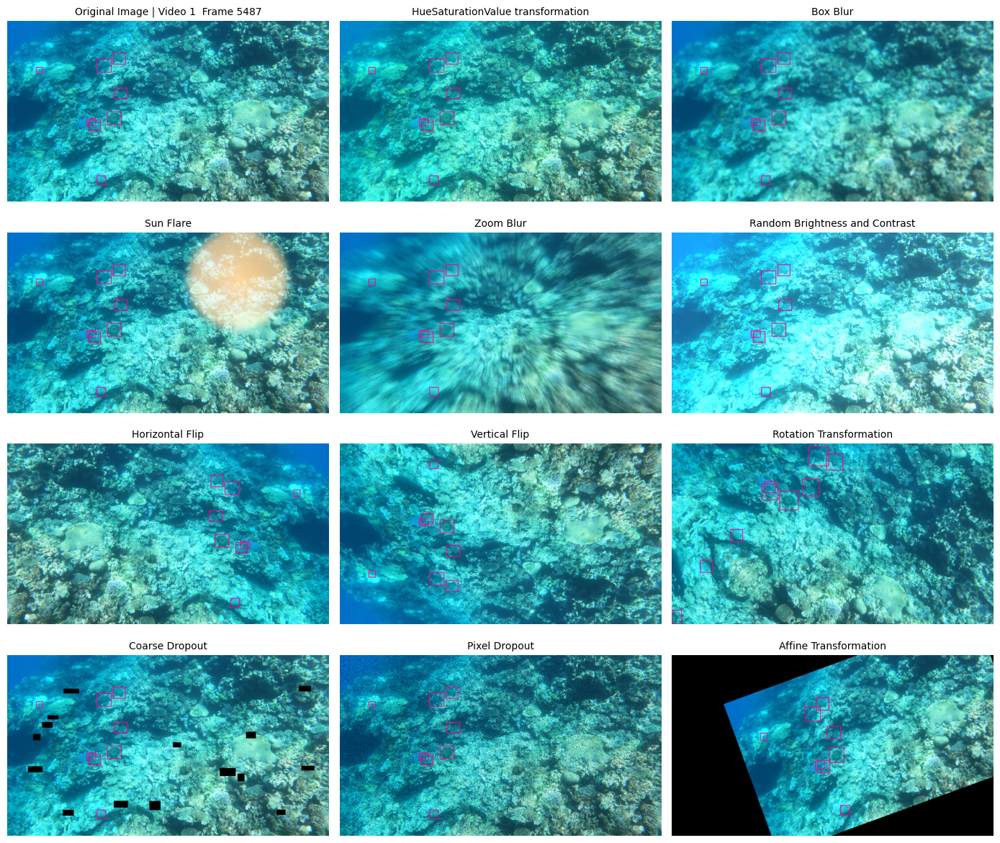

In [31]:
video_id = 1
frame_id = 5487

show_all_data_augmentation(video_id=video_id, frame_id=frame_id)


### Result 2 | Video 2 - Frame 5800

<ipython-input-20-cbeb5ac5eb17>:38: UserWarning: Argument 'fill_value' is not valid and will be ignored.
  A.CoarseDropout(
<ipython-input-20-cbeb5ac5eb17>:38: UserWarning: Argument 'mask_fill_value' is not valid and will be ignored.
  A.CoarseDropout(


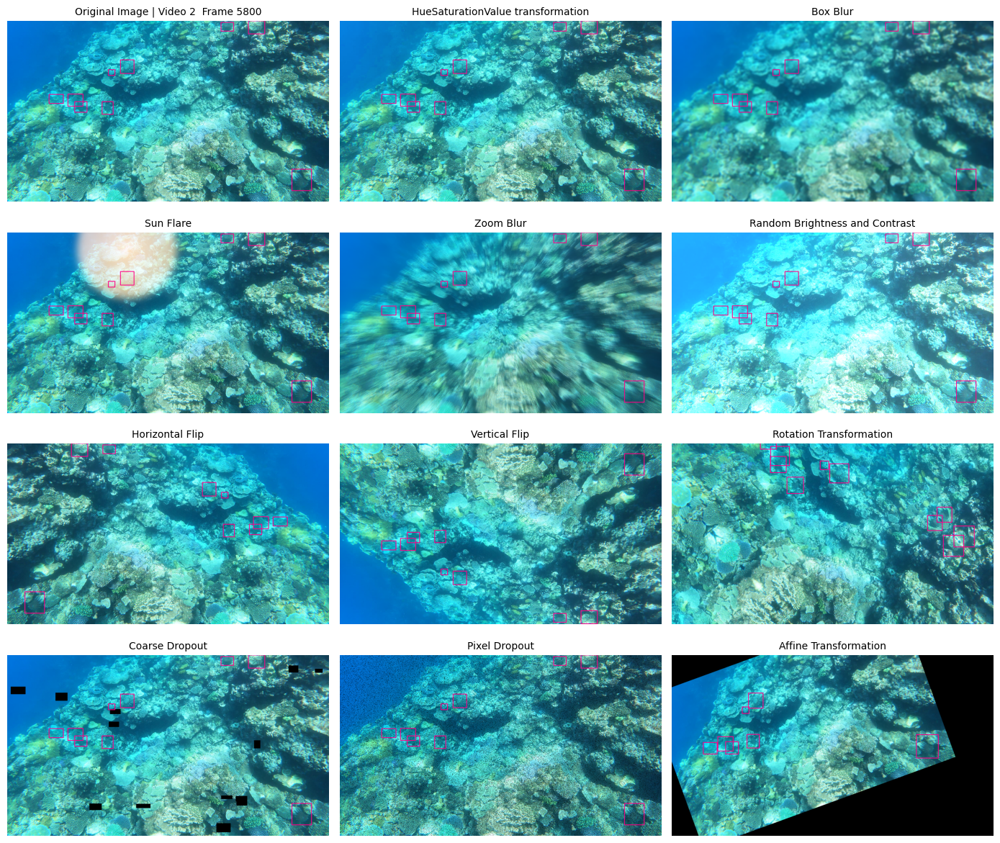

In [32]:
video_id_2 = 2
frame_id_2 = 5800

show_all_data_augmentation(video_id=video_id_2, frame_id=frame_id_2)


# Reference:
[1] Australian Institute of Marine Science. Reef monitoring sampling methods, n.d. Accessed: 2024-12-07.

[2] Jiajun Liu, Brano Kusy, Ross Marchant, Brendan Do, Torsten Merz, Joey Crosswell, Andy Steven, Nic Heaney, Karl von Richter, Lachlan Tychsen-Smith, David Ahmedt-Aristizabal, Mohammad Ali Armin, Geoffrey Carlin, Russ Babcock, Peyman Moghadam, Daniel Smith, Tim Davis, Kemal El Moujahid, Martin Wicke, and Megha Malpani. The CSIRO Crown-of-Thorn Starfish Detection Dataset, 2021.

[3] Ultralytics Team. Hyperparameter tuning guide. https://docs.ultralytics.com/guides/hyperparameter-tuning/#what-are-hyperparameters, 2024. Accessed: 2024-12-09.

[4] Ultralytics. YOLOv11: Object detection and image segmentation models. https://docs.ultralytics.com/models/yolo11/, 2024.

[5] UNESCO World Heritage Centre. Great Barrier Reef, n.d. Accessed: 2024-12-07.

[6] Sanghyun Woo, Jongchan Park, Joon-Young Lee, and In So Kweon. CBAM: Convolutional Block Attention Module, 2018.
